# Character Survival Analysis

## Theory

If time to event has the probability density function $f(t)$ and cumulative distribution function $F(t)$, then the probability of surviving at least to time $t$ is: $Pr(T>t)=S(t)=1-F(t)$. 

Cumulative hazard at time t is defined as $H(t)=-ln(S(t))$ and instantaneous hazard at time $t$ is $h(t)=\frac{dH(t)}{dt}$. The instantateous hazard can also be written as $h(t)=\frac{f(t)}{S(t)}$

The likelihood function for survival analysis is described as:

$$ l(\beta) = \prod_{n=1}^{n} h(t_{i})^{d_{i}} S(t_{i}) $$
where $d_i$ is the censoring variable that equals to 1 if the event is observed for individual $i$ and 0 if the event is not observed (censored) for individual $i$, $h(t_i)$ is the hazard for individual $i$ at time $t$, $H(t_i)$ is the cumulative hazard for individual $i$ at time $t$, and $S(t_i)$ is the survival probability for individual $i$ at time $t$. Note that when $d_i=0$, the contribution of the $i$'th individual to the likelihood function is just its survival probability until time $t$: S(t). If the individual has the event, the contribution to the likelihood function is given by the density function $f(t)=h(t)S(t)$.

The log of likelihood is:

$$ logl(\beta) = \sum_{i=1}^n d_i log(h(t_i)) - H(t_i) $$
where $log$ is the natural logarithm.

## Importing Libraries

In [7]:
#生存分析
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import statsmodels.api as st
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE

#Lifelines is a survival analysis package
from lifelines import KaplanMeierFitter
from lifelines.statistics import multivariate_logrank_test   
from lifelines.statistics import logrank_test
from lifelines import CoxPHFitter

## Data Preparation

In [2]:
##数据预处理
df = pd.read_csv("Telco_Customer_Churn_Survival_Analysis.csv")
df.head()

,CustomerID,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Internet_Service,Online_Security,...,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Label,Churn_Value
0,0002-ORFBO,Female,No,Yes,No,9,Yes,No,DSL,No,...,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3,No,0
1,0003-MKNFE,Male,No,No,No,9,Yes,Yes,DSL,No,...,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4,No,0
2,0004-TLHLJ,Male,No,No,No,4,Yes,No,Fiber optic,No,...,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85,Yes,1
3,0011-IGKFF,Male,Yes,Yes,No,13,Yes,No,Fiber optic,No,...,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85,Yes,1
4,0013-EXCHZ,Female,Yes,Yes,No,3,Yes,No,Fiber optic,No,...,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4,Yes,1


In [3]:
df.drop(['CustomerID','Churn_Label'], axis = 1, inplace= True)

df.Total_Charges = df.Total_Charges.replace(" ",np.nan)
df.Total_Charges.fillna(0, inplace = True)
df.Total_Charges = df.Total_Charges.astype(float)

df.head()

,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Internet_Service,Online_Security,Online_Backup,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
0,Female,No,Yes,No,9,Yes,No,DSL,No,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.30,0
1,Male,No,No,No,9,Yes,Yes,DSL,No,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.40,0
2,Male,No,No,No,4,Yes,No,Fiber optic,No,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85,1
3,Male,Yes,Yes,No,13,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85,1
4,Female,Yes,Yes,No,3,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.40,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Gender             7043 non-null   object 
 1   Senior_Citizen     7043 non-null   object 
 2   Partner            7043 non-null   object 
 3   Dependents         7043 non-null   object 
 4   Tenure_Months      7043 non-null   int64  
 5   Phone_Service      7043 non-null   object 
 6   Multiple_Lines     7043 non-null   object 
 7   Internet_Service   7043 non-null   object 
 8   Online_Security    7043 non-null   object 
 9   Online_Backup      7043 non-null   object 
 10  Device_Protection  7043 non-null   object 
 11  Tech_Support       7043 non-null   object 
 12  Streaming_TV       7043 non-null   object 
 13  Streaming_Movies   7043 non-null   object 
 14  Contract           7043 non-null   object 
 15  Paperless_Billing  7043 non-null   object 
 16  Payment_Method     7043 

In [5]:
eventvar = df['Churn_Value']
timevar = df['Tenure_Months']

In [6]:
categorical = ['Gender', 'Senior_Citizen', 'Partner', 'Dependents', 'Phone_Service', 'Multiple_Lines',
       'Internet_Service', 'Online_Security', 'Online_Backup', 'Device_Protection',
       'Tech_Support', 'Streaming_TV', 'Streaming_Movies', 'Contract',
       'Paperless_Billing', 'Payment_Method']

survivaldata= pd.get_dummies(df, columns = categorical, drop_first= True)
survivaldata.head()

,Tenure_Months,Monthly_Charges,Total_Charges,Churn_Value,Gender_Male,Senior_Citizen_Yes,Partner_Yes,Dependents_Yes,Phone_Service_Yes,Multiple_Lines_No phone service,...,Streaming_TV_No internet service,Streaming_TV_Yes,Streaming_Movies_No internet service,Streaming_Movies_Yes,Contract_One year,Contract_Two year,Paperless_Billing_Yes,Payment_Method_Credit card (automatic),Payment_Method_Electronic check,Payment_Method_Mailed check
0,9,65.6,593.30,0,0,0,1,0,1,0,...,0,1,0,0,1,0,1,0,0,1
1,9,59.9,542.40,0,1,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,1
2,4,73.9,280.85,1,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0
3,13,98.0,1237.85,1,1,1,1,0,1,0,...,0,1,0,1,0,0,1,0,1,0
4,3,83.9,267.40,1,0,1,1,0,1,0,...,0,1,0,0,0,0,1,0,0,1


In [7]:
pd.isnull(survivaldata).sum()

Tenure_Months                             0
Monthly_Charges                           0
Total_Charges                             0
Churn_Value                               0
Gender_Male                               0
Senior_Citizen_Yes                        0
Partner_Yes                               0
Dependents_Yes                            0
Phone_Service_Yes                         0
Multiple_Lines_No phone service           0
Multiple_Lines_Yes                        0
Internet_Service_Fiber optic              0
Internet_Service_No                       0
Online_Security_No internet service       0
Online_Security_Yes                       0
Online_Backup_No internet service         0
Online_Backup_Yes                         0
Device_Protection_No internet service     0
Device_Protection_Yes                     0
Tech_Support_No internet service          0
Tech_Support_Yes                          0
Streaming_TV_No internet service          0
Streaming_TV_Yes                

In [8]:
# survivaldata.to_csv(r'survivaldata.csv',index=False)

## Survival Analysis

### Kaplan-Meier Curve

The Kaplan-Meier method calculates the probability of survival at time 𝑡  as:

$$ S(t) = \prod_{i=1}^{t-1} (1 - \frac{d_i}{n_i}) $$

where,
- 𝑆(𝑡) is the probability of survival until time 𝑡, 
- $𝑑_𝑖$  is the number of units that experienced the event at time 𝑡,  
- $𝑛_𝑖$  is the number of units at risk of experiencing the event at time 𝑡.  

$𝑛_𝑖$ decreases with time, as units experience the event or are censored. $\frac{d_i}{n_i}$ is the probability of experiencing the event at time 𝑖 and $(1− \frac{d_i}{n_i})$ is the probability of surviving at time 𝑖. 

Note that this method does not use any parameters, it only depends on the data on time and censoring.

     All Customers_lower_0.95  All Customers_upper_0.95
0.5                       inf                       inf


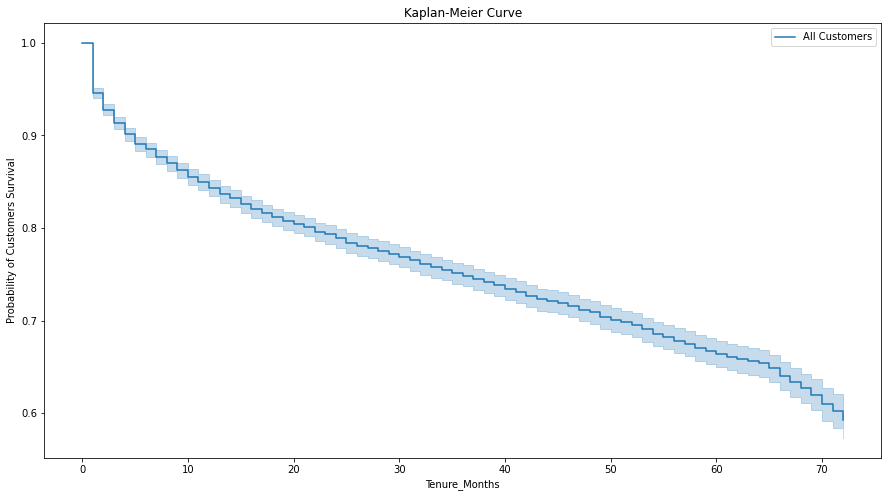

In [9]:
##Kaplan-Meier Curve
from lifelines.utils import median_survival_times
kmf = KaplanMeierFitter()
kmf.fit(timevar,event_observed = eventvar,label = "All Customers")
plt.figure(figsize=(15,8))
kmf.plot()
plt.ylabel('Probability of Customers Survival')
plt.xlabel('Tenure_Months')
plt.title('Kaplan-Meier Curve');

median_ = kmf.median_survival_time_
median_confidence_interval_ = median_survival_times(kmf.confidence_interval_)
print(median_confidence_interval_)

结论：
- 在前5个月时，客户流失率快速升高，在10月后逐渐放缓
- 在65-70个月时，客户流失率又逐渐升高

### Log-Rank Test

We can use non-parametric method log-rank test to compare survival curves between different groups. The log-rank test assumes that the hazards of the groups are proportional. Under the null hypothesis, the probability of event across the groups is the same for all time points. 

To test the null hypothesis, the log-rank test calculates the difference between the observed number of events and the number of events expected in each group proportional to the size of the groups at each time point an event is observed. The log-rank test statistic for group $j$ $(k_{j})$ follows a $\chi^2$ distribution and is calculated as:

$$k_{j} = \frac{(O_{j}-E_{j})^{2}}{var(O_{j}-E_{j})}$$

$O_{j}-E_{j}$ is calculated as:

$$O_{j}-E_{j} = \sum_{i}(o_{ij}-e_{ij})$$ 

and $var(O_{j}-E_{j})$ is:

$$var(O_{j}-E_{j}) = o_{i}\frac{n_{ij}}{n_{i}}\Big(1-\frac{n_{ij}}{n_{i}}\Big)\frac{(n_{i}-o_{i})}{(n_{i}-1)}$$

$o_{ij}$ is the observed number of events in group $j$ at time $i$ and $e_{ij}$ is the expected number of events in group $j$ at time $i$, which is calculated as $e_{ij} = \frac{n_{ij}}{n_i}{o_{i}}$. Note that $\frac{n_{ij}}{n_i}$ is the proportion of units in group $j$ at risk of event at time $i$ ($n_{ij}$) to the number of units in all groups at risk of event at time $i$ ($n_{i}$) and ${o_{i}}$ is the observed number of events in all groups at time $i$. 

When comparing multiple groups, we first calculate the pairwise log-rank test scores between each of the $k-1$ groups, and write them as a vector of log-rank statistics, $\bf{Z}$ which has $k - 1$ elements. We can leave any of one of the statistics out, because the $k$ covariances are linearly dependent on each other (the sum of log-rank statistics is 0, $\sum k_{j}=0$.

The test statistic for the hypothesis that there is no difference in survival times of $k$ groups is calculated as: 

$$logrankstatistic = \bf{Z} {\sum}^{-1} \bf{Z}'$$ 

which has a $\chi^2$ distribution, where ${\sum}^{-1}$ is the inverse of the $k-1$ by $k-1$ variance-covariance matrix of $\bf{Z}$, which has variance of $k_{j}$ on its diagonal elements and $covar(k_{jg})$ on its off-diagonal elements.

The variance of observed number of events in group $j$ is calculated as $var(O_{j}-E_{j})$ as demonstrated above. The covariance between the observed number of events in group $j$ and $g$ is calculated as:

$$covar(k_{jg})=o_{i}\frac{(n_{ij}n_{ig})}{(n_{i}n_{i})}\frac{(n_{i}-o_{i})}{(n_{i}-1)}$$

Note that rejecting the null hypothesis means that the survival times of groups do not come from the same distribution, it does not specify which group's survival time is different. The following plots and test statistics compare the groups in the dataset in terms of the different explanatory variables. Astatistically significant log-rank test statistic indicates that we can reject the null hypothesis that time to survival in all groups come from the same distribution.

#### Gender

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.53 0.47      1.09

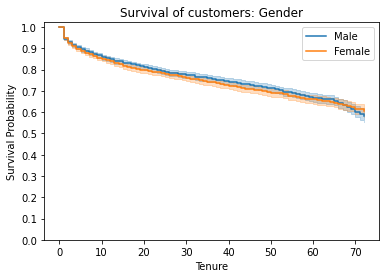

In [10]:
##Gender
male = (survivaldata['Gender_Male'] == 1)
female = (survivaldata['Gender_Male'] == 0)

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[male],event_observed = eventvar[male],label = "Male")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[female],event_observed = eventvar[female],label = "Female")
plot2 = kmf.plot(ax = plot1)
                 
plt.title('Survival of customers: Gender')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
groups = logrank_test(timevar[male], timevar[female], event_observed_A=eventvar[male], event_observed_B=eventvar[female])
groups.print_summary()

#### Senior Citizen

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
         109.49 <0.005     82.71

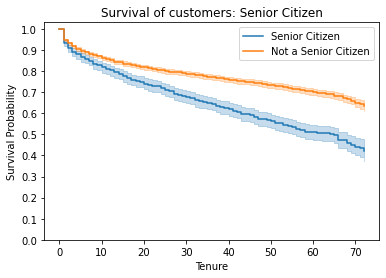

In [11]:
##Senior Citizen
SeniorCitizen = (survivaldata['Senior_Citizen_Yes'] == 1)
no_SeniorCitizen = (survivaldata['Senior_Citizen_Yes'] == 0)

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[SeniorCitizen],event_observed = eventvar[SeniorCitizen],label = "Senior Citizen")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[no_SeniorCitizen],event_observed = eventvar[no_SeniorCitizen],label = "Not a Senior Citizen")
plot2 = kmf.plot(ax = plot1)
                 
plt.title('Survival of customers: Senior Citizen')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
groups = logrank_test(timevar[SeniorCitizen], timevar[no_SeniorCitizen], event_observed_A=eventvar[SeniorCitizen], event_observed_B=eventvar[no_SeniorCitizen])
groups.print_summary()

#### Partner

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
         423.54 <0.005    310.21

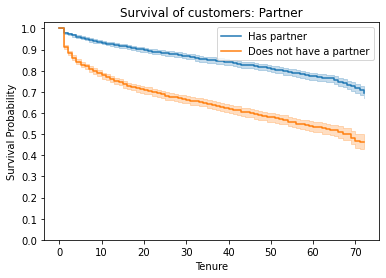

In [12]:
##Partner
partner = (survivaldata['Partner_Yes'] == 1)
no_partner = (survivaldata['Partner_Yes'] == 0)

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[partner],event_observed = eventvar[partner],label = "Has partner")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[no_partner],event_observed = eventvar[no_partner],label = "Does not have a partner")
plot2 = kmf.plot(ax = plot1)
                 
plt.title('Survival of customers: Partner')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
groups = logrank_test(timevar[partner], timevar[no_partner], event_observed_A=eventvar[partner], event_observed_B=eventvar[no_partner])
groups.print_summary()

### Dependents

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
         414.52 <0.005    303.69

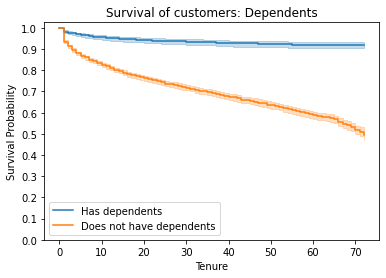

In [13]:
##Dependents
Dependents = (survivaldata['Dependents_Yes'] == 1)
no_Dependents = (survivaldata['Dependents_Yes'] == 0)

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[Dependents],event_observed = eventvar[Dependents],label = "Has dependents")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[no_Dependents],event_observed = eventvar[no_Dependents],label = "Does not have dependents")
plot2 = kmf.plot(ax = plot1)
                 
plt.title('Survival of customers: Dependents')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
groups = logrank_test(timevar[Dependents], timevar[no_Dependents], event_observed_A=eventvar[Dependents], event_observed_B=eventvar[no_Dependents])
groups.print_summary()

### PhoneService

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.43 0.51      0.97

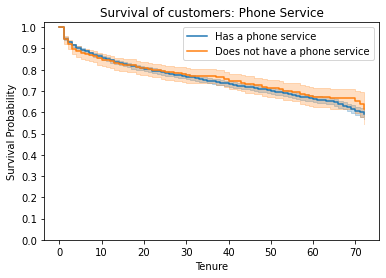

In [14]:
##PhoneService
PhoneService = (survivaldata['Phone_Service_Yes'] == 1)
no_PhoneService = (survivaldata['Phone_Service_Yes'] == 0)

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[PhoneService],event_observed = eventvar[PhoneService],label = "Has a phone service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[no_PhoneService],event_observed = eventvar[no_PhoneService],label = "Does not have a phone service")
plot2 = kmf.plot(ax = plot1)
                 
plt.title('Survival of customers: Phone Service')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
groups = logrank_test(timevar[PhoneService], timevar[no_PhoneService], event_observed_A=eventvar[PhoneService], event_observed_B=eventvar[no_PhoneService])
groups.print_summary()

### MultipleLines

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
          30.97 <0.005     22.34

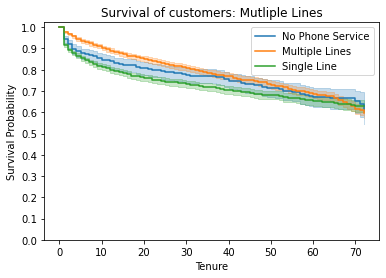

In [15]:
##MultipleLines
no_phone = (survivaldata['Multiple_Lines_No phone service'] == 1)
multiLines = (survivaldata['Multiple_Lines_Yes'] == 1)
no_multiLines = ((survivaldata['Multiple_Lines_Yes'] == 0) & (survivaldata['Multiple_Lines_No phone service'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_phone],event_observed = eventvar[no_phone],label = "No Phone Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[multiLines],event_observed = eventvar[multiLines],label = "Multiple Lines")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_multiLines],event_observed = eventvar[no_multiLines],label = "Single Line")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Mutliple Lines')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Multiple_Lines'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Internet Service

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         520.12 <0.005    375.19

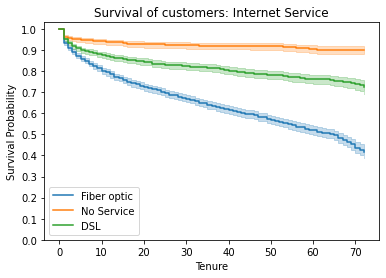

In [16]:
##Internet Service
Fiber_optic = (survivaldata['Internet_Service_Fiber optic'] == 1)
No_Service = (survivaldata['Internet_Service_No'] == 1)
DSL = ((survivaldata['Internet_Service_Fiber optic'] == 0) & (survivaldata['Internet_Service_No'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[Fiber_optic],event_observed = eventvar[Fiber_optic],label = "Fiber optic")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[No_Service],event_observed = eventvar[No_Service],label = "No Service")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[DSL],event_observed = eventvar[DSL],label = "DSL")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Internet Service')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Internet_Service'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Online Security

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
        1013.86 <0.005    731.35

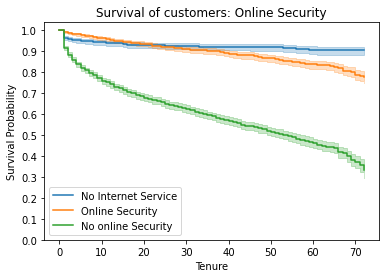

In [17]:
##Online Security
no_internetService = (survivaldata['Online_Security_No internet service'] == 1)
onlineSecurity = (survivaldata['Online_Security_Yes'] == 1)
no_onlineSecurity = ((survivaldata['Online_Security_No internet service'] == 0) & (survivaldata['Online_Security_Yes'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_internetService],event_observed = eventvar[no_internetService],label = "No Internet Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[onlineSecurity],event_observed = eventvar[onlineSecurity],label = "Online Security")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_onlineSecurity],event_observed = eventvar[no_onlineSecurity],label = "No online Security")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Online Security')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Online_Security'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Online Backup

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         821.34 <0.005    592.47

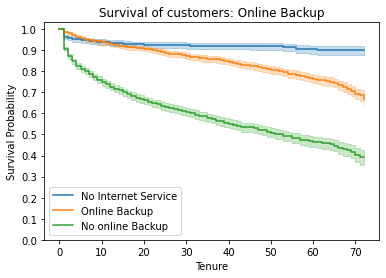

In [18]:
##Online Backup
no_internetService = (survivaldata['Online_Backup_No internet service'] == 1)
onlineBackup = (survivaldata['Online_Backup_Yes'] == 1)
no_onlineBackup = ((survivaldata['Online_Backup_No internet service'] == 0) & (survivaldata['Online_Backup_Yes'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_internetService],event_observed = eventvar[no_internetService],label = "No Internet Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[onlineBackup],event_observed = eventvar[onlineBackup],label = "Online Backup")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_onlineBackup],event_observed = eventvar[no_onlineBackup],label = "No online Backup")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Online Backup')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Online_Backup'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Device Protection

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         763.51 <0.005    550.75

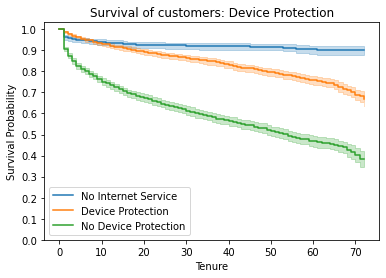

In [19]:
##Device Protection
no_internetService = (survivaldata['Device_Protection_No internet service'] == 1)
DeviceProtection = (survivaldata['Device_Protection_Yes'] == 1)
no_DeviceProtection = ((survivaldata['Device_Protection_No internet service'] == 0) & (survivaldata['Device_Protection_Yes'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_internetService],event_observed = eventvar[no_internetService],label = "No Internet Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[DeviceProtection],event_observed = eventvar[DeviceProtection],label = "Device Protection")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_DeviceProtection],event_observed = eventvar[no_DeviceProtection],label = "No Device Protection")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Device Protection')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Device_Protection'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Tech Support

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         989.56 <0.005    713.82

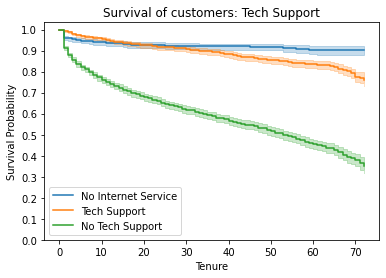

In [20]:
##Device Protection
no_internetService = (survivaldata['Tech_Support_No internet service'] == 1)
TechSupport = (survivaldata['Tech_Support_Yes'] == 1)
no_TechSupport = ((survivaldata['Tech_Support_No internet service'] == 0) & (survivaldata['Tech_Support_Yes'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_internetService],event_observed = eventvar[no_internetService],label = "No Internet Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[TechSupport],event_observed = eventvar[TechSupport],label = "Tech Support")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_TechSupport],event_observed = eventvar[no_TechSupport],label = "No Tech Support")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Tech Support')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Tech_Support'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Streaming TV

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         368.31 <0.005    265.68

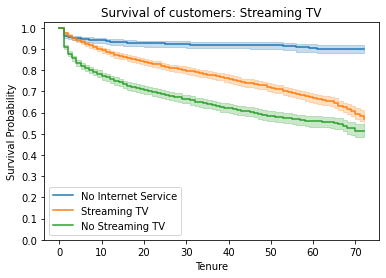

In [21]:
##Streaming TV
no_internetService = (survivaldata['Streaming_TV_No internet service'] == 1)
StreamingTV = (survivaldata['Streaming_TV_Yes'] == 1)
no_StreamingTV = ((survivaldata['Streaming_TV_No internet service'] == 0) & (survivaldata['Streaming_TV_Yes'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_internetService],event_observed = eventvar[no_internetService],label = "No Internet Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[StreamingTV],event_observed = eventvar[StreamingTV],label = "Streaming TV")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_StreamingTV],event_observed = eventvar[no_StreamingTV],label = "No Streaming TV")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Streaming TV')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Streaming_TV'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Streaming Movies

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         378.43 <0.005    272.98

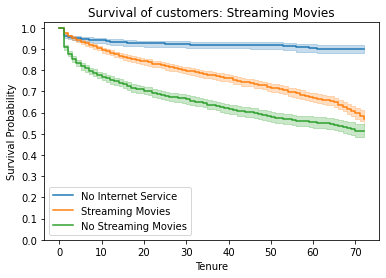

In [22]:
##Streaming Movies
no_internetService = (survivaldata['Streaming_Movies_No internet service'] == 1)
StreamingMovies = (survivaldata['Streaming_Movies_Yes'] == 1)
no_StreamingMovies = ((survivaldata['Streaming_Movies_No internet service'] == 0) & (survivaldata['Streaming_Movies_Yes'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[no_internetService],event_observed = eventvar[no_internetService],label = "No Internet Service")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[StreamingMovies],event_observed = eventvar[StreamingMovies],label = "Streaming Movies")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[no_StreamingMovies],event_observed = eventvar[no_StreamingMovies],label = "No Streaming Movies")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Streaming Movies')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Streaming_Movies'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Contract

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 2
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
        2352.87 <0.005       inf

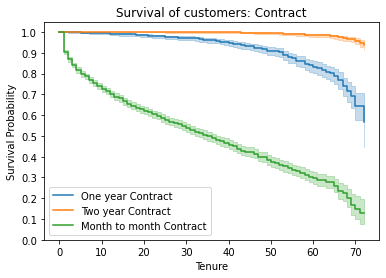

In [23]:
##Contract
Contract_One_year = (survivaldata['Contract_One year'] == 1)
Contract_Two_year = (survivaldata['Contract_Two year'] == 1)
Contract_month_to_month = ((survivaldata['Contract_One year'] == 0) & (survivaldata['Contract_Two year'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[Contract_One_year],event_observed = eventvar[Contract_One_year],label = "One year Contract")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[Contract_Two_year],event_observed = eventvar[Contract_Two_year],label = "Two year Contract")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[Contract_month_to_month],event_observed = eventvar[Contract_month_to_month],label = "Month to month Contract")
plot3 = kmf.plot(ax = plot2)
                 
plt.title('Survival of customers: Contract')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Contract'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Payment Method

<lifelines.StatisticalResult: multivariate_logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 3
             alpha = 0.95
         test_name = multivariate_logrank_test

---
 test_statistic      p  -log2(p)
         865.24 <0.005    619.58

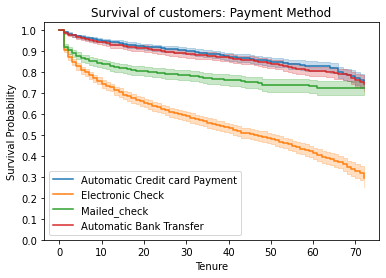

In [24]:
##Payment Method
automatic_Credit_Card = (survivaldata['Payment_Method_Credit card (automatic)'] == 1)
electronic_check = (survivaldata['Payment_Method_Electronic check'] == 1)
mailed_check = (survivaldata['Payment_Method_Mailed check'] == 1)
automatic_Bank_Transfer = ((survivaldata['Payment_Method_Credit card (automatic)'] == 0) & (survivaldata['Payment_Method_Electronic check'] == 0) & (survivaldata['Payment_Method_Mailed check'] == 0))

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[automatic_Credit_Card],event_observed = eventvar[automatic_Credit_Card],label = "Automatic Credit card Payment")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[electronic_check],event_observed = eventvar[electronic_check],label = "Electronic Check")
plot2 = kmf.plot(ax = plot1)

kmf.fit(timevar[mailed_check],event_observed = eventvar[mailed_check],label = "Mailed_check")
plot3 = kmf.plot(ax = plot2)

kmf.fit(timevar[automatic_Bank_Transfer],event_observed = eventvar[automatic_Bank_Transfer],label = "Automatic Bank Transfer")
plot4 = kmf.plot(ax = plot3)
                 
plt.title('Survival of customers: Payment Method')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
twoplusgroups_logrank = multivariate_logrank_test(df['Tenure_Months'], df['Payment_Method'], df['Churn_Value'], alpha = 0.95)
twoplusgroups_logrank.print_summary()

### Paperless Billing

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
         189.51 <0.005    140.82

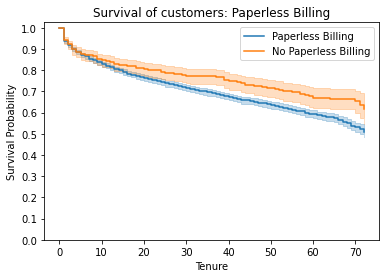

In [25]:
##Paperless Billing
PaperlessBilling = (survivaldata['Paperless_Billing_Yes'] == 1)
no_PaperlessBilling = (survivaldata['Paperless_Billing_Yes'] == 0)

plt.figure()
ax = plt.subplot(1,1,1)

kmf.fit(timevar[PaperlessBilling],event_observed = eventvar[PaperlessBilling],label = "Paperless Billing")
plot1 = kmf.plot(ax = ax)

kmf.fit(timevar[no_PhoneService],event_observed = eventvar[no_PhoneService],label = "No Paperless Billing")
plot2 = kmf.plot(ax = plot1)
                 
plt.title('Survival of customers: Paperless Billing')
plt.xlabel('Tenure')
plt.ylabel('Survival Probability')
plt.yticks(np.linspace(0,1,11))
groups = logrank_test(timevar[PaperlessBilling], timevar[no_PaperlessBilling], event_observed_A=eventvar[PaperlessBilling], event_observed_B=eventvar[no_PaperlessBilling])
groups.print_summary()

## Survival Regression

In [3]:
##Survival Regression
def datapreparation(filepath):
    
    df = pd.read_csv(filepath)
    df.drop(["CustomerID",'Churn_Label'], inplace = True, axis = 1)
    
    df.Total_Charges = df.Total_Charges.replace(" ",np.nan)
    df.Total_Charges.fillna(0, inplace = True)
    df.Total_Charges = df.Total_Charges.astype(float)
    
    cols1 = ['Partner', 'Dependents', 'Paperless_Billing', 'Phone_Service']
    for col in cols1:
        df[col] = df[col].apply(lambda x: 0 if x == "No" else 1)
   
    df.Gender = df.Gender.apply(lambda x: 0 if x == "Male" else 1)
    df.Multiple_Lines = df.Multiple_Lines.map({'No phone service': 0, 'No': 0, 'Yes': 1})
    
    cols2 = ['Senior_Citizen','Online_Security', 'Online_Backup', 'Device_Protection', 'Tech_Support', 'Streaming_TV', 'Streaming_Movies']
    for col in cols2:
        df[col] = df[col].map({'No internet service': 0, 'No': 0, 'Yes': 1})
    
    df = pd.get_dummies(df, columns=['Internet_Service', 'Contract', 'Payment_Method'], drop_first=True)
    
    return df

In [4]:
regression_df = datapreparation("Telco_Customer_Churn_Survival_Analysis.csv")
regression_df.head()

,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Online_Security,Online_Backup,Device_Protection,...,Monthly_Charges,Total_Charges,Churn_Value,Internet_Service_Fiber optic,Internet_Service_No,Contract_One year,Contract_Two year,Payment_Method_Credit card (automatic),Payment_Method_Electronic check,Payment_Method_Mailed check
0,1,0,1,0,9,1,0,0,1,0,...,65.6,593.30,0,0,0,1,0,0,0,1
1,0,0,0,0,9,1,1,0,0,0,...,59.9,542.40,0,0,0,0,0,0,0,1
2,0,0,0,0,4,1,0,0,0,1,...,73.9,280.85,1,1,0,0,0,0,1,0
3,0,1,1,0,13,1,0,0,1,1,...,98.0,1237.85,1,1,0,0,0,0,1,0
4,1,1,1,0,3,1,0,0,0,0,...,83.9,267.40,1,1,0,0,0,0,0,1


In [5]:
regression_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Gender                                  7043 non-null   int64  
 1   Senior_Citizen                          7043 non-null   int64  
 2   Partner                                 7043 non-null   int64  
 3   Dependents                              7043 non-null   int64  
 4   Tenure_Months                           7043 non-null   int64  
 5   Phone_Service                           7043 non-null   int64  
 6   Multiple_Lines                          7043 non-null   int64  
 7   Online_Security                         7043 non-null   int64  
 8   Online_Backup                           7043 non-null   int64  
 9   Device_Protection                       7043 non-null   int64  
 10  Tech_Support                            7043 non-null   int6

In [8]:
##划分训练集测试集
train, test = train_test_split(regression_df, test_size=0.2)

In [30]:
# regression_df.to_csv(r'survivaldata.csv',index=False)

### PH Test

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 5634 total observations, 4122 right-censored observations>
         test_name = proportional_hazard_test

---
                                             test_statistic      p  -log2(p)
Contract_One year                      km             79.35 <0.005     60.74
                                       rank           73.20 <0.005     56.24
Contract_Two year                      km            103.48 <0.005     78.33
                                       rank           87.10 <0.005     66.40
Dependents                             km             25.74 <0.005     21.29
                                       rank           18.82 <0.005     16.09
Device_Protection                      km              0.26   0.61      0.72
                                       rank            0.83   0.36      1.46
Gender                                 km              1.12   0.29      1.79
                                       rank            1.27   0.26      1.94
Internet_Service_Fiber optic           km              0.40   0.53      0.93
                                       rank            0.85   0.36      1.49
Internet_Service_No                    km              4.49   0.03      4.87
                                       rank            6.81   0.01      6.79
Monthly_Charges                        km              0.31   0.58      0.78
                                       rank            0.17   0.68      0.56
Multiple_Lines                         km              0.21   0.65      0.63
                                       rank            1.13   0.29      1.80
Online_Backup                          km              0.99   0.32      1.65
                                       rank            1.82   0.18      2.50
Online_Security                        km              0.37   0.54      0.88
                                       rank            1.16   0.28      1.83
Paperless_Billing                      km              2.19   0.14      2.85
                                       rank            2.67   0.10      3.29
Partner                                km              5.72   0.02      5.90
                                       rank            7.46   0.01      7.31
Payment_Method_Credit card (automatic) km              0.03   0.87      0.20
                                       rank            0.03   0.86      0.21
Payment_Method_Electronic check        km              0.59   0.44      1.18
                                       rank            1.50   0.22      2.18
Payment_Method_Mailed check            km              0.52   0.47      1.08
                                       rank            2.42   0.12      3.06
Phone_Service                          km              0.60   0.44      1.19
                                       rank            1.58   0.21      2.26
Senior_Citizen                         km              6.93   0.01      6.88
                                       rank            5.84   0.02      6.00
Streaming_Movies                       km              0.22   0.64      0.65
                                       rank            0.65   0.42      1.25
Streaming_TV                           km              0.61   0.43      1.21
                                       rank            1.21   0.27      1.88
Tech_Support                           km              1.19   0.28      1.86
                                       rank            1.85   0.17      2.52
Total_Charges                          km            130.14 <0.005     97.73
                                       rank           18.72 <0.005     16.01



1. Variable 'Senior_Citizen' failed the non-proportional test: p-value is 0.0085.

   Advice: with so few unique values (only 2), you can include `strata=['Senior_Citizen', ...]` in
the call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


2. Variable 'Partner' failed the non-proportional test: p-value is 0.0063.

   Advice: with so few unique values (only 2), you can include `strata=['Partner', ...]` in the call
in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


3. Variable 'Dependents' failed the non-proportional test: p-value is <5e-05.

   Advice: with so few unique values (only 2), you can include `strata=['Dependents', ...]` in the
call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


4. Variable 'Total_Charges' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'Total_

[[<AxesSubplot:xlabel='rank-transformed time\n(p=0.0156)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0085)'>],
 [<AxesSubplot:xlabel='rank-transformed time\n(p=0.0063)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0168)'>],
 [<AxesSubplot:xlabel='rank-transformed time\n(p=0.0000)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0000)'>],
 [<AxesSubplot:xlabel='rank-transformed time\n(p=0.0000)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0000)'>],
 [<AxesSubplot:xlabel='rank-transformed time\n(p=0.0090)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0341)'>],
 [<AxesSubplot:xlabel='rank-transformed time\n(p=0.0000)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0000)'>],
 [<AxesSubplot:xlabel='rank-transformed time\n(p=0.0000)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0000)'>]]

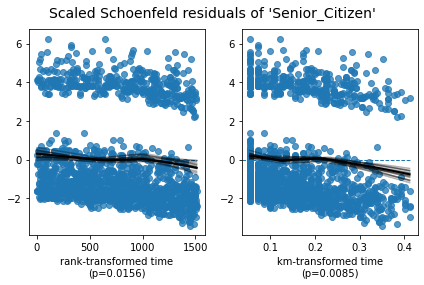

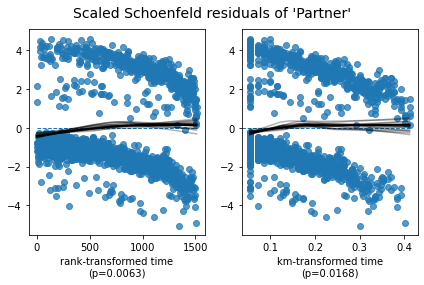

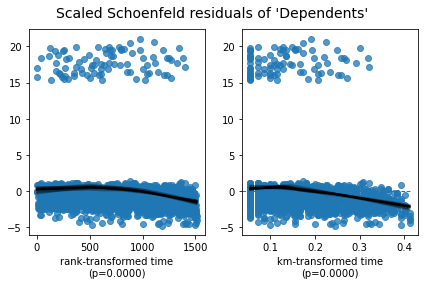

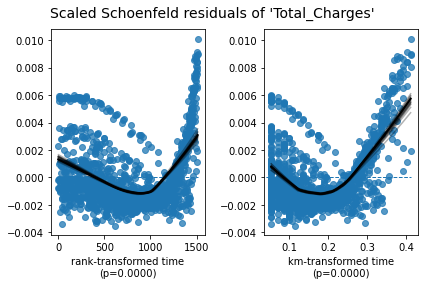

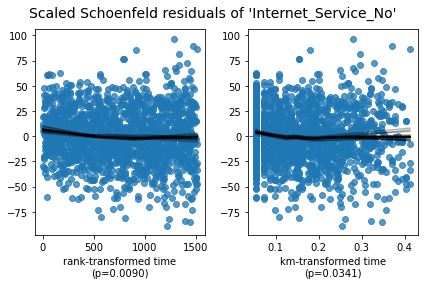

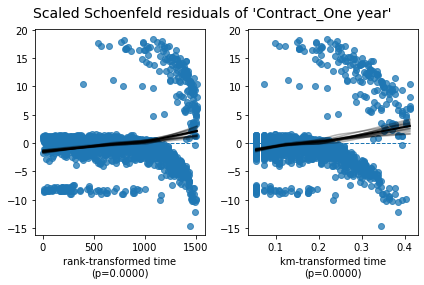

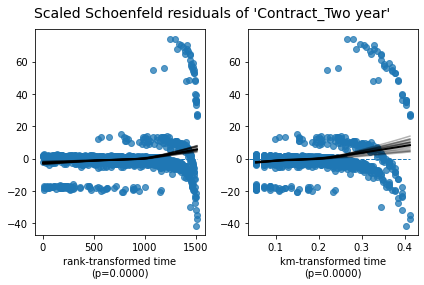

In [9]:
#比例风险假设检验
cph = CoxPHFitter()
cph.fit(train, duration_col='Tenure_Months', event_col='Churn_Value')
cph.check_assumptions(train, p_value_threshold=0.05, show_plots=True)
# cph.print_summary()

### strata 

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 5634 total observations, 4122 right-censored observations>
         test_name = proportional_hazard_test

---
                                             test_statistic      p  -log2(p)
Device_Protection                      km              0.04   0.84      0.25
                                       rank            0.21   0.65      0.63
Gender                                 km              0.48   0.49      1.03
                                       rank            0.65   0.42      1.25
Internet_Service_Fiber optic           km              0.15   0.70      0.52
                                       rank            0.01   0.91      0.14
Monthly_Charges                        km              1.46   0.23      2.14
                                       rank            0.72   0.40      1.34
Multiple_Lines                         km              0.03   0.86      0.22
                                       rank            0.02   0.90      0.15
Online_Backup                          km              0.23   0.63      0.66
                                       rank            0.02   0.89      0.17
Online_Security                        km              0.03   0.87      0.20
                                       rank            1.09   0.30      1.75
Paperless_Billing                      km              1.58   0.21      2.26
                                       rank            0.14   0.71      0.50
Payment_Method_Credit card (automatic) km              0.18   0.67      0.58
                                       rank            1.30   0.25      1.97
Payment_Method_Electronic check        km              0.17   0.68      0.56
                                       rank            1.28   0.26      1.95
Payment_Method_Mailed check            km              0.53   0.47      1.10
                                       rank            0.56   0.46      1.13
Phone_Service                          km              0.00   0.99      0.02
                                       rank            0.04   0.84      0.26
Streaming_Movies                       km              0.00   0.98      0.03
                                       rank            0.02   0.87      0.19
Streaming_TV                           km              0.06   0.80      0.32
                                       rank            0.10   0.75      0.42
Tech_Support                           km              0.34   0.56      0.84
                                       rank            0.69   0.41      1.30
Total_Charges                          km            171.98 <0.005    128.10
                                       rank            1.35   0.24      2.03



1. Variable 'Total_Charges' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'Total_Charges' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'Total_Charges' using pd.cut, and then specify it in
`strata=['Total_Charges', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...


---
[A]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html
[B]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Bin-variable-and-stratify-on-it
[C]  https://lifelines.readthedo

[[<AxesSubplot:xlabel='rank-transformed time\n(p=0.2449)'>,
  <AxesSubplot:xlabel='km-transformed time\n(p=0.0000)'>]]

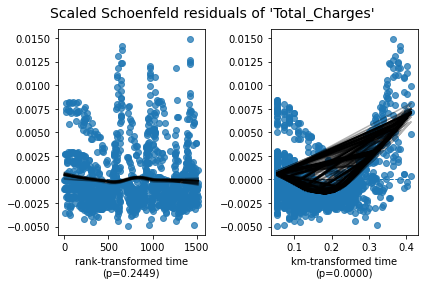

In [10]:
cph.fit(train, duration_col='Tenure_Months', event_col='Churn_Value',strata=['Dependents',"Senior_Citizen",'Partner','Internet_Service_No','Contract_One year','Contract_Two year'])
cph.check_assumptions(train, p_value_threshold=0.05, show_plots=True)

In [11]:
train_totalcharge=train.copy()
train_totalcharge['totalcharge_strata']=pd.cut(train_totalcharge['Total_Charges'],10,labels=np.arange(0, 8700, 870))#进行分箱
train_totalcharge.drop(['Total_Charges'], inplace = True, axis = 1)

In [21]:
test_totalcharge=test.copy()
test_totalcharge['totalcharge_strata']=pd.cut(test_totalcharge['Total_Charges'],10,labels=np.arange(0, 8700, 870))#进行分箱
test_totalcharge.drop(['Total_Charges'], inplace = True, axis = 1)

In [12]:
train_totalcharge

,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,Multiple_Lines,Online_Security,Online_Backup,Device_Protection,...,Monthly_Charges,Churn_Value,Internet_Service_Fiber optic,Internet_Service_No,Contract_One year,Contract_Two year,Payment_Method_Credit card (automatic),Payment_Method_Electronic check,Payment_Method_Mailed check,totalcharge_strata
3275,1,1,0,0,11,1,1,1,0,0,...,55.60,0,0,0,0,0,0,1,0,0
5718,1,1,0,0,1,1,0,0,0,0,...,70.55,1,1,0,0,0,0,1,0,0
4225,0,0,0,0,1,1,0,0,0,0,...,79.05,1,1,0,0,0,0,1,0,0
5495,1,0,1,1,1,0,0,0,0,0,...,40.10,1,0,0,0,0,0,1,0,0
699,1,0,0,0,1,1,0,0,0,0,...,70.85,1,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3111,0,0,0,1,30,0,0,0,0,0,...,44.50,0,0,0,0,0,0,1,0,870
6115,1,0,1,1,71,1,1,1,0,1,...,100.45,0,1,0,0,1,0,1,0,6960
4182,1,1,0,0,18,1,1,0,1,0,...,85.45,1,1,0,0,0,0,1,0,870
1442,1,0,1,0,70,1,1,0,1,1,...,84.80,0,0,0,0,1,0,0,0,5220


In [14]:
cph.fit(train_totalcharge, duration_col='Tenure_Months', event_col='Churn_Value',strata=['Dependents',"Senior_Citizen",'Partner','Internet_Service_No','Contract_One year','Contract_Two year','Payment_Method_Credit card (automatic)','totalcharge_strata'])
cph.check_assumptions(train_totalcharge, p_value_threshold=0.05, show_plots=True)

Proportional hazard assumption looks okay.


[]

In [15]:
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 5634 total observations, 4122 right-censored observations>
             duration col = 'Tenure_Months'
                event col = 'Churn_Value'
                   strata = ['Dependents', 'Senior_Citizen', 'Partner', 'Internet_Service_No', 'Contract_One year', 'Contract_Two year', 'Payment_Method_Credit card (automatic)', 'totalcharge_strata']
      baseline estimation = breslow
   number of observations = 5634
number of events observed = 1512
   partial log-likelihood = -5469.34
         time fit was run = 2022-04-12 10:51:27 UTC

---
                                  coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                               
Gender                            0.07       1.08       0.05            -0.03             0.18                 0.97                 1.20
Phone_Service                    -0.63       0.53       0.56            -1.72             0.47                 0.18                 1.60
Multiple_Lines                   -0.12       0.89       0.15            -0.41             0.18                 0.66                 1.19
Online_Security                  -0.43       0.65       0.16            -0.73            -0.12                 0.48                 0.89
Online_Backup                    -0.26       0.77       0.15            -0.56             0.04                 0.57                 1.04
Device_Protection                -0.20       0.82       0.15            -0.49             0.09                 0.61                 1.09
Tech_Support                     -0.34       0.72       0.16            -0.64            -0.03                 0.53                 0.97
Streaming_TV                     -0.18       0.84       0.28            -0.72             0.37                 0.49                 1.45
Streaming_Movies                 -0.21       0.81       0.28            -0.75             0.33                 0.47                 1.40
Paperless_Billing                 0.14       1.15       0.07             0.01             0.27                 1.01                 1.31
Monthly_Charges                   0.05       1.05       0.03             0.00             0.11                 1.00                 1.11
Internet_Service_Fiber optic     -0.17       0.84       0.68            -1.51             1.17                 0.22                 3.22
Payment_Method_Electronic check   0.36       1.43       0.08             0.19             0.52                 1.21                 1.68
Payment_Method_Mailed check       0.38       1.46       0.10             0.18             0.58                 1.20                 1.79

                                    z      p   -log2(p)
covariate                                              
Gender                           1.36   0.17       2.53
Phone_Service                   -1.12   0.26       1.93
Multiple_Lines                  -0.79   0.43       1.22
Online_Security                 -2.72   0.01       7.26
Online_Backup                   -1.73   0.08       3.57
Device_Protection               -1.36   0.17       2.53
Tech_Support                    -2.14   0.03       4.95
Streaming_TV                    -0.63   0.53       0.92
Streaming_Movies                -0.76   0.45       1.16
Paperless_Billing                2.14   0.03       4.96
Monthly_Charges                  1.96   0.05       4.34
Internet_Service_Fiber optic    -0.25   0.80       0.32
Payment_Method_Electronic check  4.30 <0.005      15.81
Payment_Method_Mailed check      3.70 <0.005      12.16
---
Concordance = 0.62
Partial AIC = 10966.68
log-likelihood ratio test = 574.52 on 14 df
-log2(p) of ll-ratio test = 374.89

结论：
 - 拟合效果较好，其Concordance Index达到0.63。Concordance Index是AUC的推广，取值范围在[0, 1]之间，0.5为随机预测的结果，越靠近1，预测效果越好。
 - Online_Security，Payment_Method_Electronic check，Payment_Method_Electronic check在5%的显著性水平下时显著的
 - 从系数coef可知每个特征是如何“增加”风险的。如果系数是一个正数，那么该特征使客户更有可能流失，如果是负数，那么拥有该特征的客户就不太可能流失。
     - Online_Security的水平越高，其用户流失风险越低
     - Payment_Method_Electronic check，Payment_Method_Mailed check的水平越高，用户流失风险越高
 - exp(coef)即为相对危险度HR 。

<AxesSubplot:xlabel='log(HR) (95% CI)'>

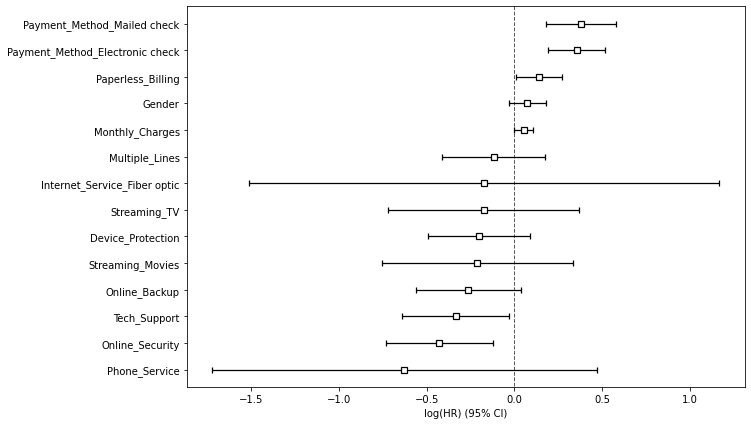

In [16]:
fig, ax = plt.subplots(figsize = (10,7))
cph.plot(ax = ax)

###  Plotting the effect of varying a covariate

After fitting, we can plot what the survival curves look like as we vary a single covariate while holding everything else equal. This is useful to understand the impact of a covariate, given the model.

plot_partial_effects_on_outcome生成一个曲线图，将模型的基线曲线与组中的协变量随值变化时发生的情况进行比较，改变协变量时保持所有其他变量不变。基线曲线等于原始数据集中所有平均值的预测y曲线。

E:\Anaconda\lib\site-packages\lifelines\fitters\coxph_fitter.py:972: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  ax = plt.figure().add_subplot(1, 1, 1)


[<AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:

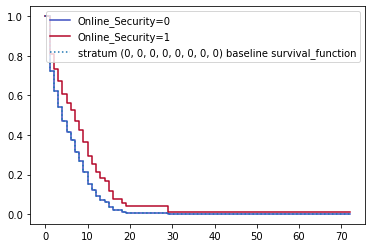

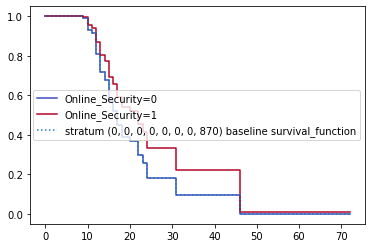

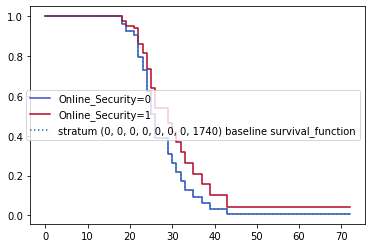

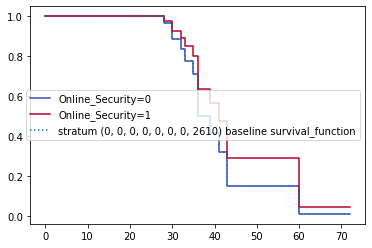

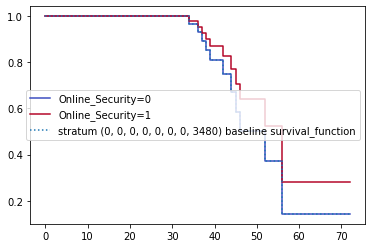

...

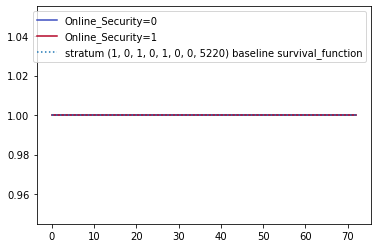

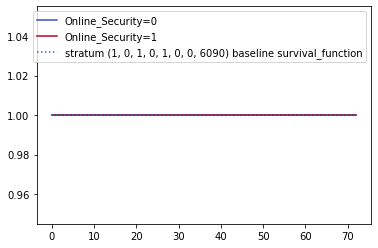

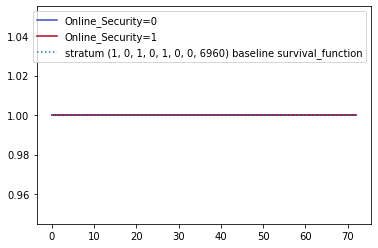

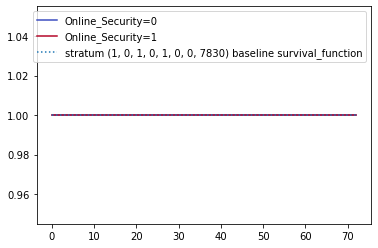

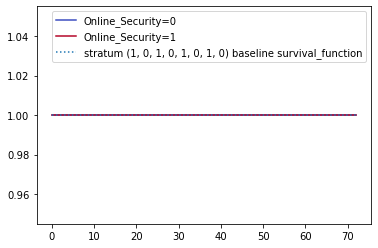

Error in callback <function flush_figures at 0x000001ED40EA1310> (for post_execute):


KeyboardInterrupt: 

In [17]:
cph.plot_partial_effects_on_outcome(covariates='Online_Security', values=[0, 1], cmap='coolwarm')

结论：
 - 参考：https://lifelines.readthedocs.io/en/latest/Survival%20Regression.html#residuals
 - 0-870,870-1740,1740-2610,2610-3480,3480-4350,4350-5220,5220-6090,6090-6960,6960-8700:取下区间为标签
 - 总的来说未选择Online_Security的客户比选择Online_Security的客户更容易流失
 - 总费用越高的客户更不容易流失。且总费用越高，是否选择Online_Security对客户流失影响越小

E:\Anaconda\lib\site-packages\lifelines\fitters\coxph_fitter.py:972: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  ax = plt.figure().add_subplot(1, 1, 1)


KeyboardInterrupt: 

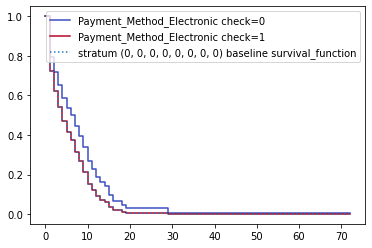

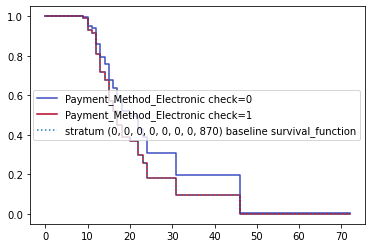

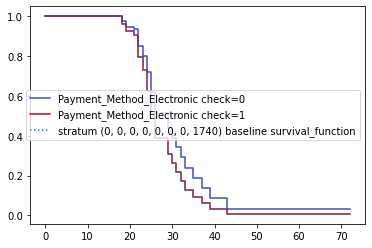

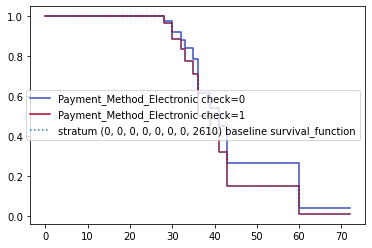

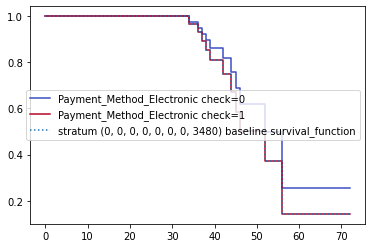

...

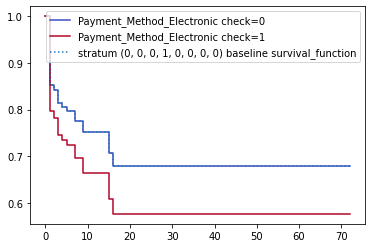

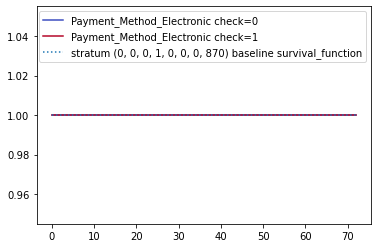

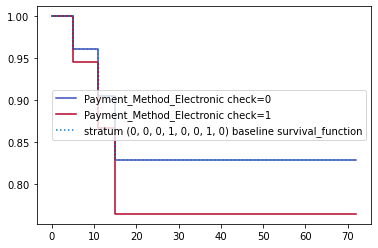

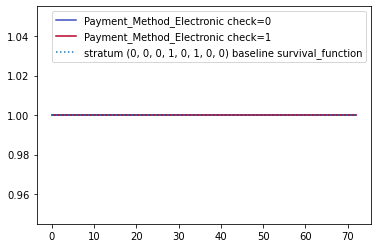

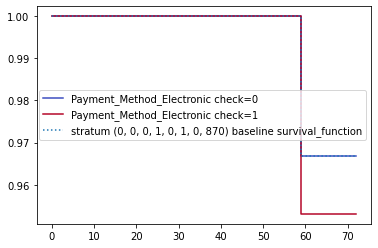

In [18]:
cph.plot_partial_effects_on_outcome(covariates='Payment_Method_Electronic check', values=[0, 1], cmap='coolwarm')

E:\Anaconda\lib\site-packages\lifelines\fitters\coxph_fitter.py:972: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  ax = plt.figure().add_subplot(1, 1, 1)


[<AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:>,
 <AxesSubplot:

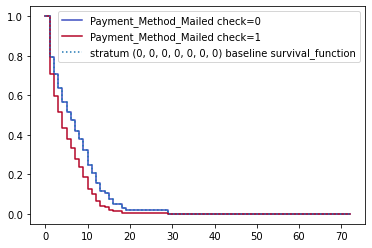

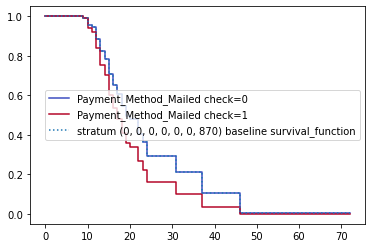

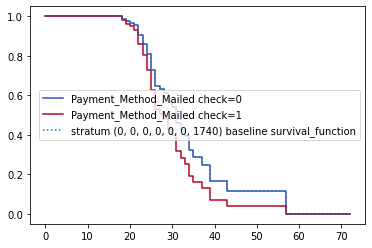

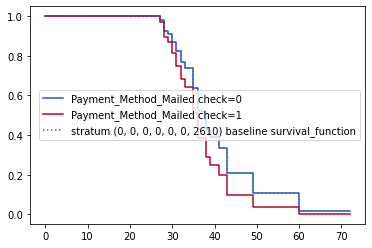

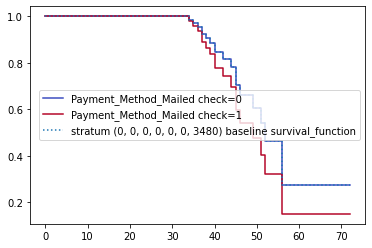

...

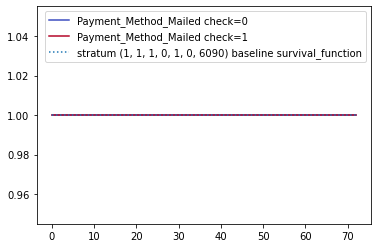

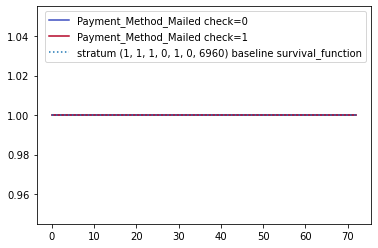

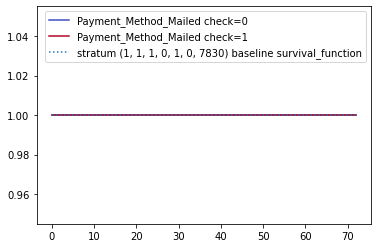

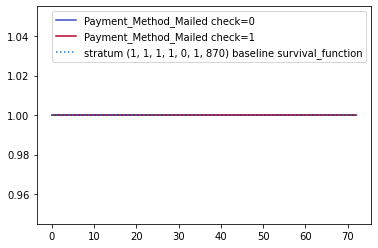

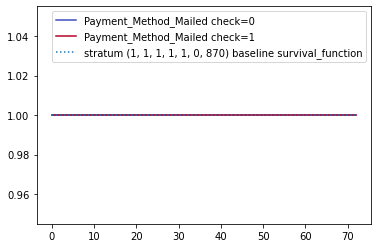

In [40]:
cph.plot_partial_effects_on_outcome(covariates='Payment_Method_Mailed check', values=[0, 1], cmap='coolwarm')

### Assesment 

参考：https://lifelines.readthedocs.io/en/latest/Survival%20Regression.html?highlight=survival%20probability%20calibration#model-probability-calibration

#### AIC

In [41]:
print(cph.AIC_partial_)

15656.807609014473


####  concordance_index

In [42]:
print(cph.concordance_index_)

0.6274260069664073


####  k_fold_cross_validation

In [19]:
from lifelines.utils import k_fold_cross_validation

In [23]:
scores = k_fold_cross_validation(cph,test_totalcharge, duration_col='Tenure_Months', event_col='Churn_Value',k=3, scoring_method="concordance_index")
print(scores)

E:\Anaconda\lib\site-packages\lifelines\utils\__init__.py:936: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")
E:\Anaconda\lib\site-packages\lifelines\utils\__init__.py:936: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


[0.6486916644186674, 0.6719078643615657, 0.6383065440558372]


E:\Anaconda\lib\site-packages\lifelines\utils\__init__.py:936: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


#### Probability Calibration 

参考：https://blog.csdn.net/fjsd155/article/details/84382838

In [24]:
from lifelines.calibration import survival_probability_calibration

StatError: The stratum (0, 0, 0, 0, 1, 0, 1, 5220) was not found in the original training data. For example, try
                            the following on the original dataset, df: `df.groupby(['Dependents', 'Senior_Citizen', 'Partner', 'Internet_Service_No', 'Contract_One year', 'Contract_Two year', 'Payment_Method_Credit card (automatic)', 'totalcharge_strata']).size()`. Expected is that (0, 0, 0, 0, 1, 0, 1, 5220) is not present in the output.

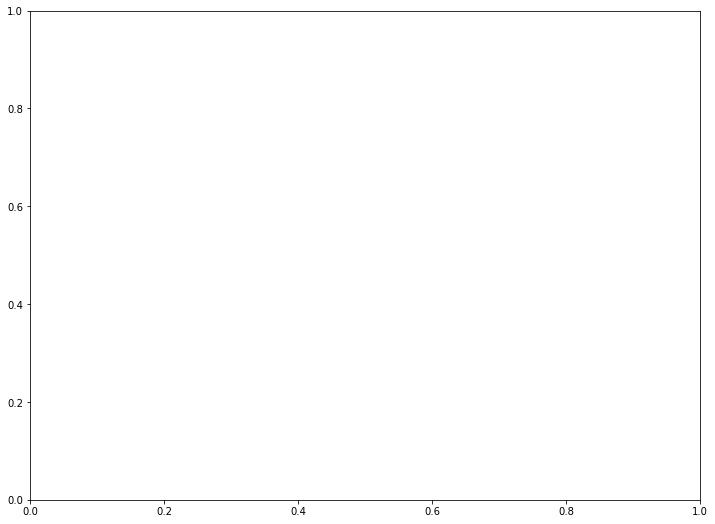

In [25]:
fig,ax = plt.subplots(figsize=(12,9))
survival_probability_calibration(cph,test_totalcharge, t0=40, ax=ax)
ax.grid() 

In [ ]:
regression_df_totalcharge.groupby(['Dependents', 'Senior_Citizen', 'Partner', 'Internet_Service_No', 'Contract_One year', 'Contract_Two year', 'totalcharge_strata']).size()